In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score,roc_curve

In [2]:
from pandas_profiling import ProfileReport

/var/folders/4d/gf6xkqsd5tx6m_zltry403dc0000gn/T/ipykernel_3920/2274191625.py:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [3]:
df=pd.read_csv('winequality-red.csv')
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [4]:
set(df.quality)

{3, 4, 5, 6, 7, 8}

In [5]:
df.quality.unique()

array([5, 6, 7, 4, 8, 3])

In [6]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Inference**<br>
- The Zero% of citric acid is too much high
- We will handle duplicate rows as well

## <font color='green'> Let's get started</font>

In [7]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [8]:
x=df.drop('quality',axis=1)
y=df['quality']

In [9]:
x.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4


In [10]:
y.head()

0    5
1    5
2    5
3    6
4    5
Name: quality, dtype: int64

### <font color='green'>Model</font>

In [11]:
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=.20,random_state=77)

In [12]:
dt=DecisionTreeClassifier()

In [13]:
dt.fit(xtrain,ytrain)

DecisionTreeClassifier()

In [14]:
dt.predict(xtest)

array([5, 6, 6, 8, 5, 5, 4, 5, 6, 5, 4, 4, 6, 6, 5, 6, 5, 7, 6, 5, 5, 5,
       5, 5, 6, 6, 7, 6, 7, 5, 5, 3, 6, 7, 4, 5, 6, 6, 5, 6, 5, 6, 7, 4,
       7, 6, 5, 5, 5, 7, 5, 6, 6, 6, 5, 5, 5, 6, 5, 5, 5, 7, 5, 5, 5, 7,
       6, 6, 5, 6, 5, 5, 5, 5, 5, 4, 6, 5, 5, 6, 6, 6, 8, 5, 6, 6, 6, 5,
       6, 7, 6, 6, 6, 6, 5, 7, 5, 6, 5, 6, 5, 6, 6, 6, 5, 5, 5, 6, 5, 5,
       6, 5, 5, 6, 5, 6, 6, 7, 5, 6, 5, 6, 6, 5, 7, 7, 6, 6, 7, 6, 6, 6,
       7, 7, 6, 5, 7, 6, 5, 6, 6, 5, 5, 5, 6, 6, 7, 7, 5, 5, 3, 5, 5, 7,
       7, 5, 6, 5, 6, 5, 6, 6, 6, 5, 6, 6, 5, 5, 6, 6, 5, 5, 5, 5, 6, 5,
       6, 5, 6, 5, 7, 6, 5, 5, 5, 7, 6, 5, 7, 6, 6, 5, 5, 5, 5, 6, 7, 6,
       5, 5, 6, 5, 7, 6, 6, 6, 6, 7, 4, 5, 6, 5, 7, 6, 5, 6, 5, 5, 5, 6,
       6, 5, 5, 5, 7, 7, 6, 6, 7, 6, 5, 6, 6, 6, 5, 5, 6, 5, 6, 5, 5, 6,
       6, 7, 7, 5, 5, 6, 6, 6, 5, 6, 6, 5, 7, 6, 7, 6, 5, 6, 6, 6, 5, 5,
       5, 6, 6, 6, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 5, 6, 6, 7, 6, 5, 7, 6,
       6, 6, 5, 7, 5, 6, 5, 5, 6, 6, 5, 7, 5, 5, 7,

In [15]:
dt.score(xtest,ytest)

0.609375

### Instead of ginni lets use entropy

In [16]:
dt_en=DecisionTreeClassifier(criterion='entropy')

In [17]:
dt_en.fit(xtrain,ytrain)

DecisionTreeClassifier(criterion='entropy')

In [18]:
dt_en.score(xtest,ytest)

0.590625

### Creating a dot file

In [19]:
dot_en=open('dt_en_meta.dot','w')
tree.export_graphviz(dt_en,out_file=dot_en,feature_names=x.columns)

In [20]:
dir()

['DecisionTreeClassifier',
 'GridSearchCV',
 'In',
 'Out',
 'ProfileReport',
 '_',
 '_10',
 '_13',
 '_14',
 '_15',
 '_17',
 '_18',
 '_3',
 '_4',
 '_5',
 '_6',
 '_7',
 '_9',
 '__',
 '___',
 '__builtin__',
 '__builtins__',
 '__doc__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 '_dh',
 '_i',
 '_i1',
 '_i10',
 '_i11',
 '_i12',
 '_i13',
 '_i14',
 '_i15',
 '_i16',
 '_i17',
 '_i18',
 '_i19',
 '_i2',
 '_i20',
 '_i3',
 '_i4',
 '_i5',
 '_i6',
 '_i7',
 '_i8',
 '_i9',
 '_ih',
 '_ii',
 '_iii',
 '_oh',
 'accuracy_score',
 'confusion_matrix',
 'df',
 'dot_en',
 'dt',
 'dt_en',
 'exit',
 'get_ipython',
 'np',
 'pd',
 'quit',
 'roc_auc_score',
 'roc_curve',
 'train_test_split',
 'tree',
 'x',
 'xtest',
 'xtrain',
 'y',
 'ytest',
 'ytrain']

In [21]:
#dt_en

### next class

In [22]:
import sklearn
import matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline

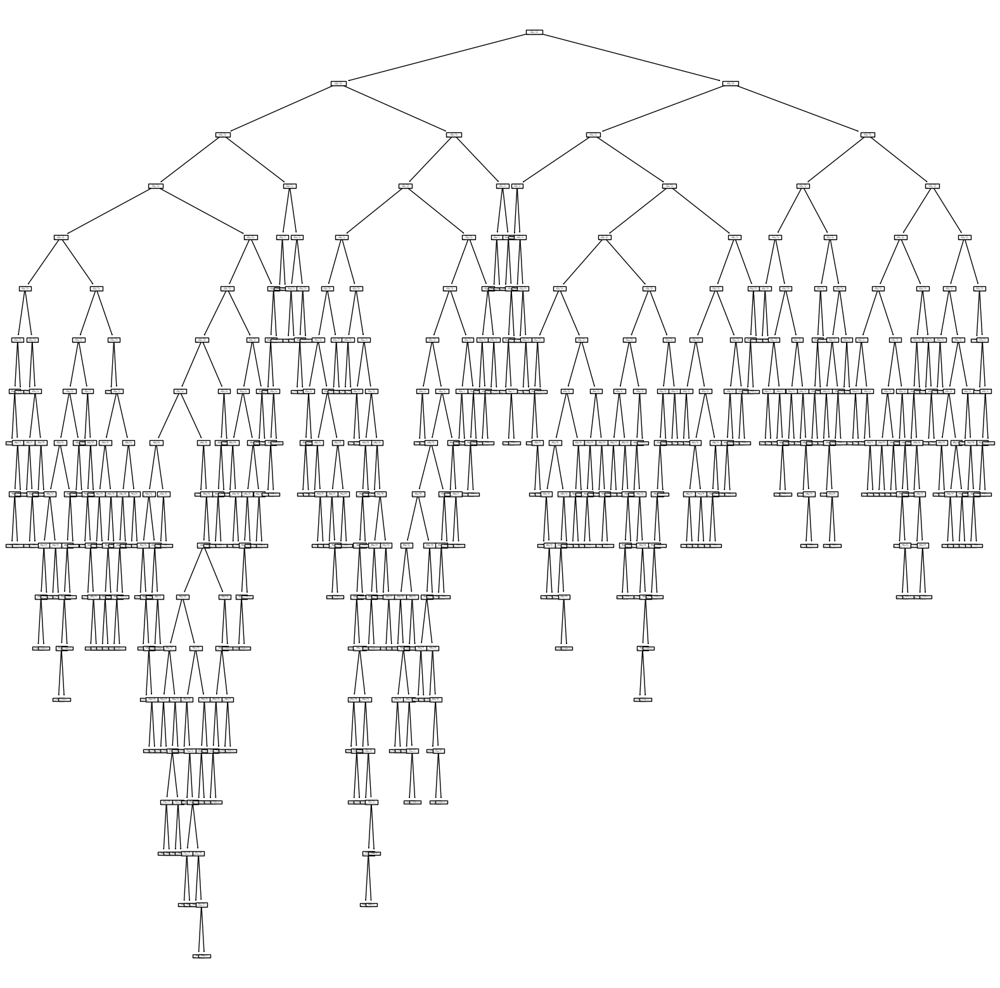

In [23]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_en)
plt.show()

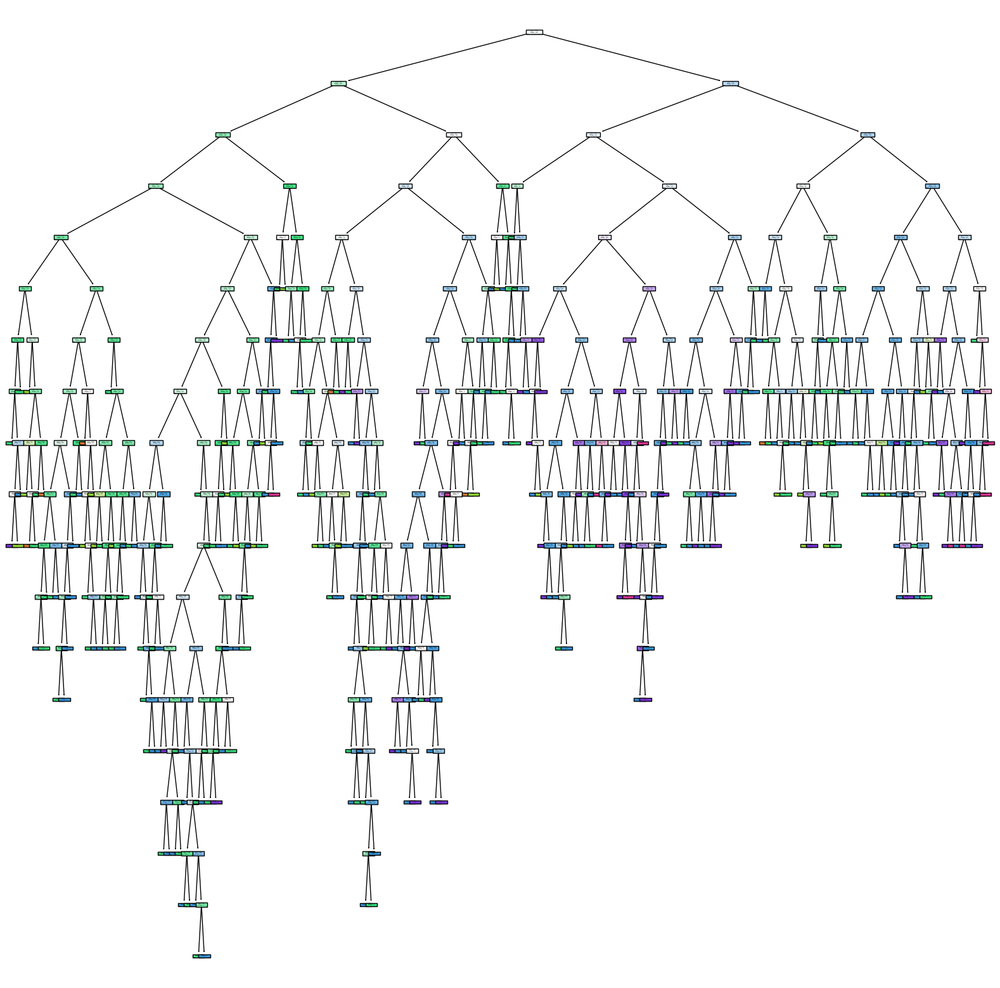

In [24]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_en,filled=True)
plt.show()

### Let's select only some records and based on that lets create a Decision Tree

In [25]:
de=df.head(30)

In [26]:
x1=de.drop('quality',axis=1)
y1=de['quality']

In [27]:
dt2=DecisionTreeClassifier(criterion='entropy')

In [28]:
dt2.fit(x1,y1)

DecisionTreeClassifier(criterion='entropy')

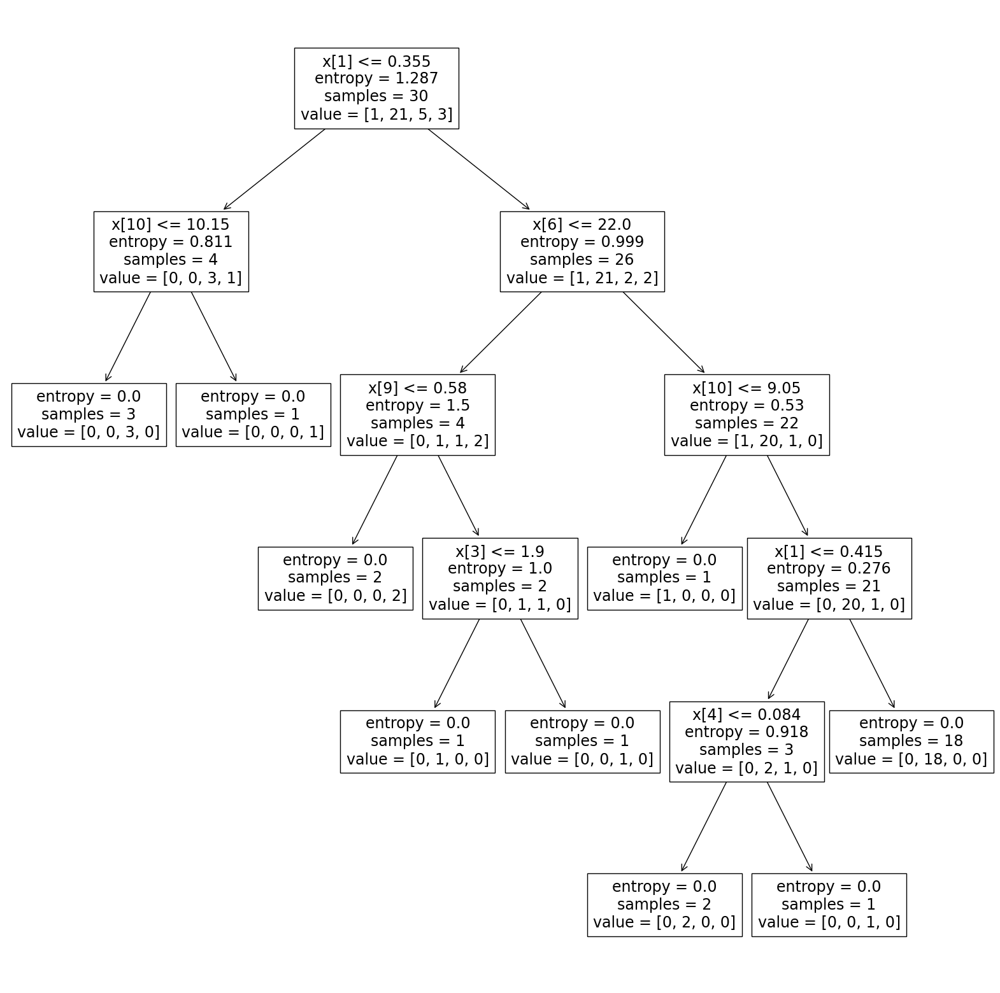

In [29]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt2)
plt.show()

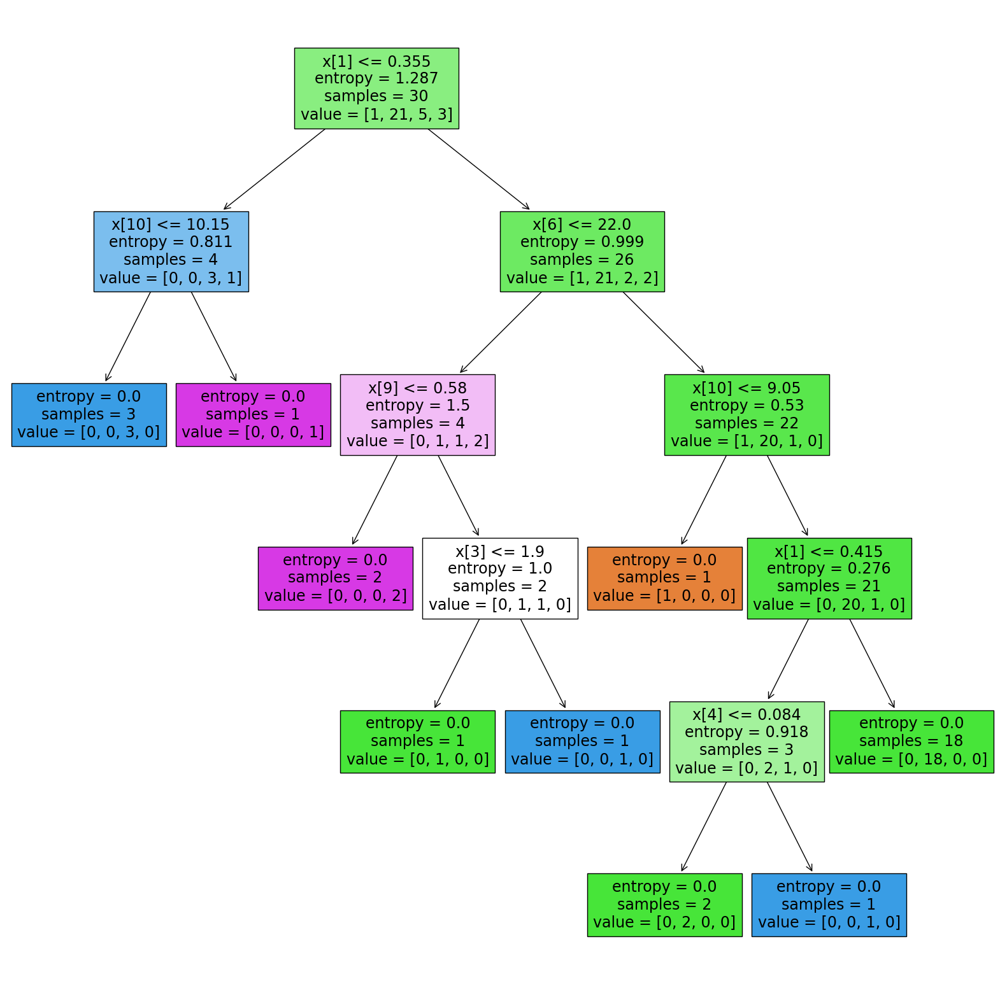

In [30]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt2,filled=True)
plt.show()

#### To see the class names

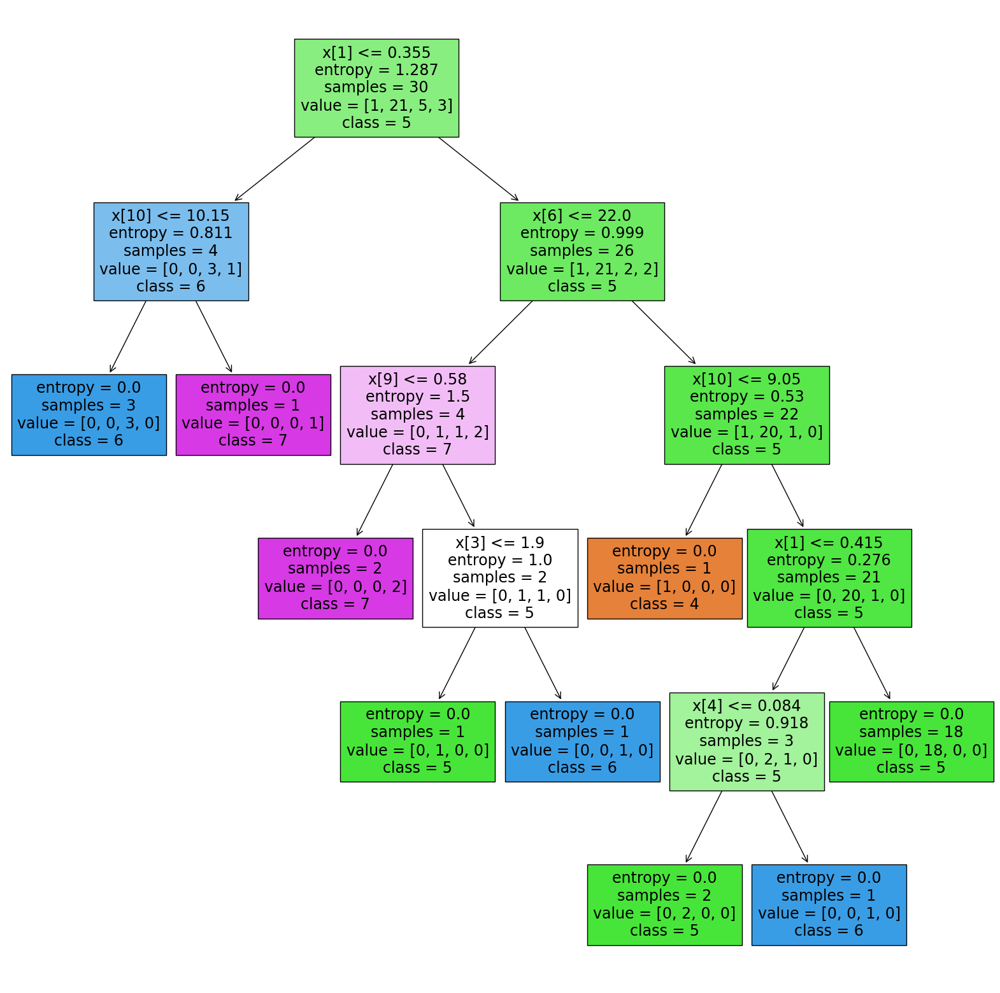

In [31]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt2,filled=True,class_names=[str(i) for i in set(y1)])
plt.show()

In [32]:
set(y1)

{4, 5, 6, 7}

In [33]:
x1.head(1)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.7,0.0,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4


- From the table above we are getting to know that we have 1 value from class 4, 21 value from clas 5, 5 value from class 6 and 3 values from class 7
- x[2] in the first box means the third column in the x dataframe 

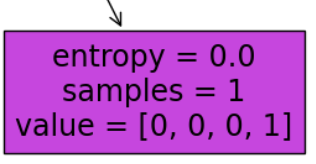

- In this place we are concluding that the class is 7 as no oter value is present( this was before seeing the class name in the tree)

#### Saving the fig

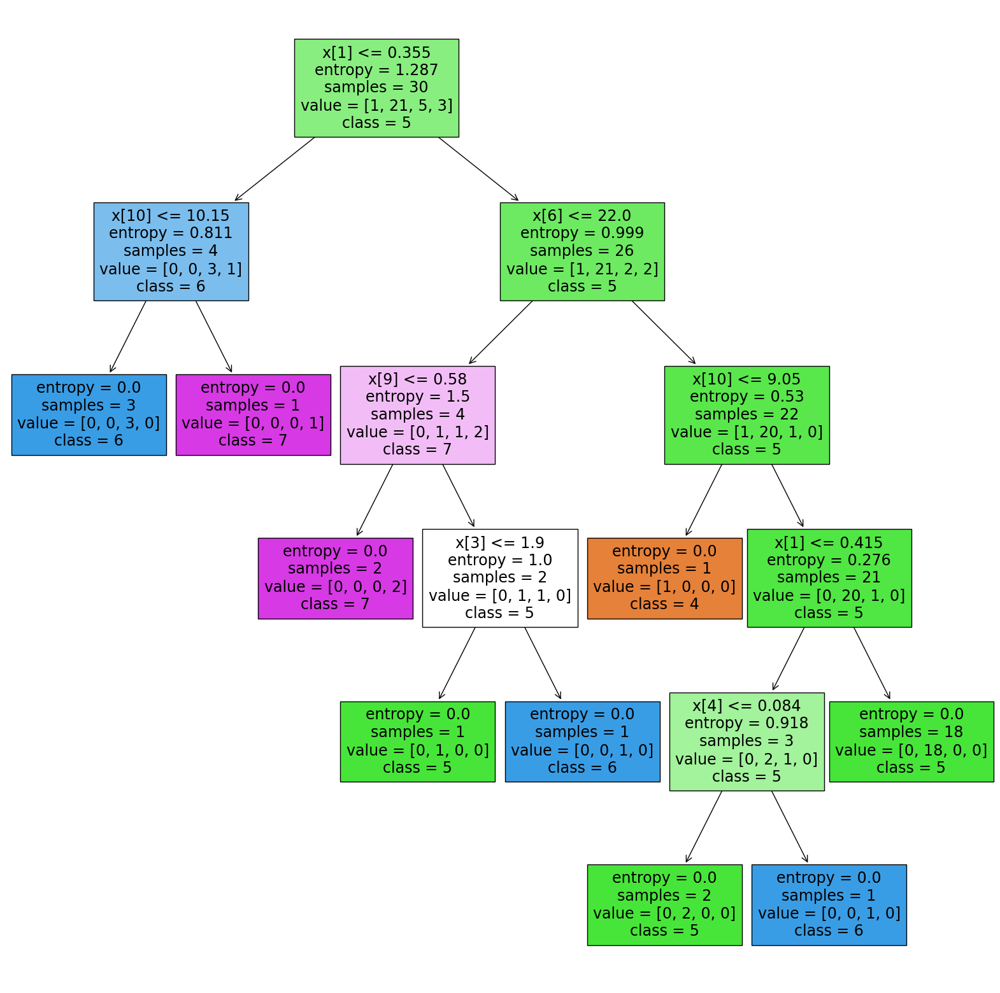

In [34]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt2,filled=True,class_names=[str(i) for i in set(y1)])
plt.savefig('dt2')

In [81]:
dt_ccp.score(xtest,ytest)

0.525

In [35]:
dt2.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6])

In [36]:
dt2.score(x1,y1)

1.0

In [37]:
dt2.score(xtest,ytest)

0.459375

- Overfitted
- Accuracy is less not an issue( train and test accuracy difference is huge then that is a big issue)

## <font color='blue'>Pruning</font>

In [38]:
path=dt2.cost_complexity_pruning_path(x1,y1)

In [39]:
path

{'ccp_alphas': array([0.        , 0.06666667, 0.09182958, 0.10150722, 0.10817042,
        0.13333333, 0.19562766, 0.27679444, 0.31285482]),
 'impurities': array([0.        , 0.06666667, 0.15849625, 0.26000347, 0.36817388,
        0.50150722, 0.69713487, 0.97392931, 1.28678413])}

So we get the impurities<br>
- So we are trying to eliminate some leaf nodes
- ccp is representing a cost complexity of a pruning (if we are going to prune then what will be our cost complexity)
- if cost of complexity is more than the cost of complexity which we are going to set then we are going to remove those branches
- ccp_alpha was 0 in our previous decision tree

In [42]:
ccp_alpha=path['ccp_alphas']
ccp_alpha

array([0.        , 0.06666667, 0.09182958, 0.10150722, 0.10817042,
       0.13333333, 0.19562766, 0.27679444, 0.31285482])

In [46]:
dt_Models=[]  #it will contain a list of many models
for ccp in ccp_alpha:
    dtt=DecisionTreeClassifier(ccp_alpha=ccp)
    dtt.fit(x1,y1)
    dt_Models.append(dtt)

In [47]:
dt_Models

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.06666666666666667),
 DecisionTreeClassifier(ccp_alpha=0.09182958340544896),
 DecisionTreeClassifier(ccp_alpha=0.10150721594810842),
 DecisionTreeClassifier(ccp_alpha=0.10817041659455104),
 DecisionTreeClassifier(ccp_alpha=0.13333333333333336),
 DecisionTreeClassifier(ccp_alpha=0.1956276577222191),
 DecisionTreeClassifier(ccp_alpha=0.27679443603470466),
 DecisionTreeClassifier(ccp_alpha=0.3128548240716781)]

In [50]:
train_score=[dt.score(x1,y1) for dt in dt_Models]
#This is the training accuracy

In [51]:
train_score

[1.0, 0.8333333333333334, 0.8, 0.8, 0.8, 0.7, 0.7, 0.7, 0.7]

In [52]:
test_score=[i.score(xtest,ytest) for i in dt_Models]

In [53]:
test_score

[0.4875,
 0.40625,
 0.453125,
 0.453125,
 0.453125,
 0.43125,
 0.43125,
 0.43125,
 0.43125]

In [54]:
#Now we are supposed to plot a graph where we need to see relation between a train score and a test score

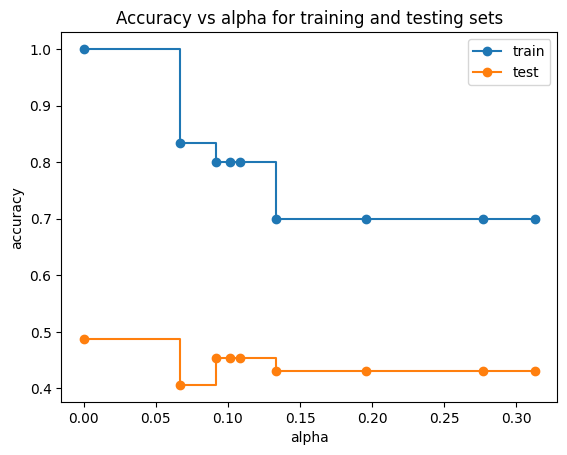

In [57]:
fig,ax=plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('accuracy')
ax.set_title('Accuracy vs alpha for training and testing sets')
ax.plot(ccp_alpha,train_score,marker='o',label='train',drawstyle='steps-post')
ax.plot(ccp_alpha,test_score,marker='o',label='test',drawstyle='steps-post')
ax.legend();


- So it the difference seems to be least around ccp alpha=0.14


### <font color='clue'>To increase the efficiency we can increase the size of the dataset given for training</font>

In [59]:
de=df.head(150)

In [60]:
x1=de.drop('quality',axis=1)
y1=de['quality']

In [61]:
path=dt2.cost_complexity_pruning_path(x1,y1)
ccp_alpha=path['ccp_alphas']
dt_Models=[]  #it will contain a list of many models
for ccp in ccp_alpha:
    dtt=DecisionTreeClassifier(ccp_alpha=ccp)
    dtt.fit(x1,y1)
    dt_Models.append(dtt)
train_score=[dt.score(x1,y1) for dt in dt_Models]
test_score=[i.score(xtest,ytest) for i in dt_Models]

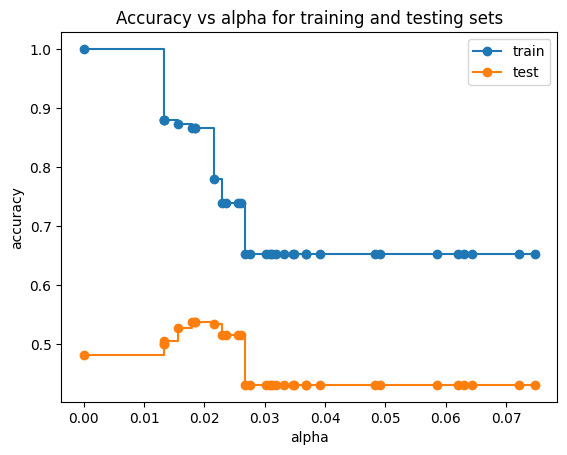

In [62]:
fig,ax=plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('accuracy')
ax.set_title('Accuracy vs alpha for training and testing sets')
ax.plot(ccp_alpha,train_score,marker='o',label='train',drawstyle='steps-post')
ax.plot(ccp_alpha,test_score,marker='o',label='test',drawstyle='steps-post')
ax.legend();

In [ ]:
#Let us increase it more

In [69]:
de=df.head(500)
x1=de.drop('quality',axis=1)
y1=de['quality']
path=dt2.cost_complexity_pruning_path(x1,y1)
ccp_alpha=path['ccp_alphas']
dt_Models=[]  #it will contain a list of many models
for ccp in ccp_alpha:
    dtt=DecisionTreeClassifier(ccp_alpha=ccp)
    dtt.fit(x1,y1)
    dt_Models.append(dtt)
train_score=[dt.score(x1,y1) for dt in dt_Models]
test_score=[i.score(xtest,ytest) for i in dt_Models]

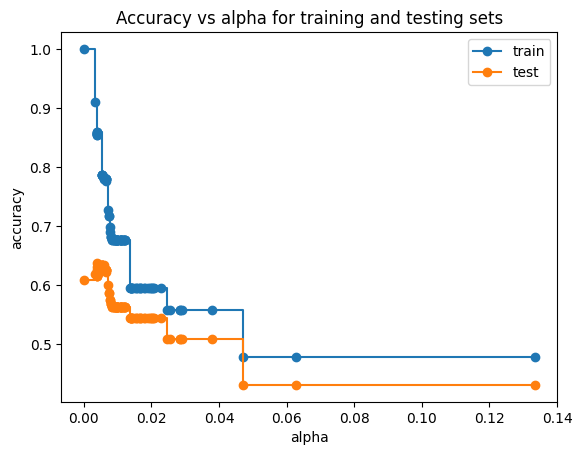

In [70]:
fig,ax=plt.subplots()
ax.set_xlabel('alpha')
ax.set_ylabel('accuracy')
ax.set_title('Accuracy vs alpha for training and testing sets')
ax.plot(ccp_alpha,train_score,marker='o',label='train',drawstyle='steps-post')
ax.plot(ccp_alpha,test_score,marker='o',label='test',drawstyle='steps-post')
ax.legend();

### <font color='green'> Next Step will be to build the model again</font>

In [77]:
dt_ccp=DecisionTreeClassifier(random_state=0,ccp_alpha=0.022)
dt_ccp.fit(xtrain,ytrain)

DecisionTreeClassifier(ccp_alpha=0.022, random_state=0)

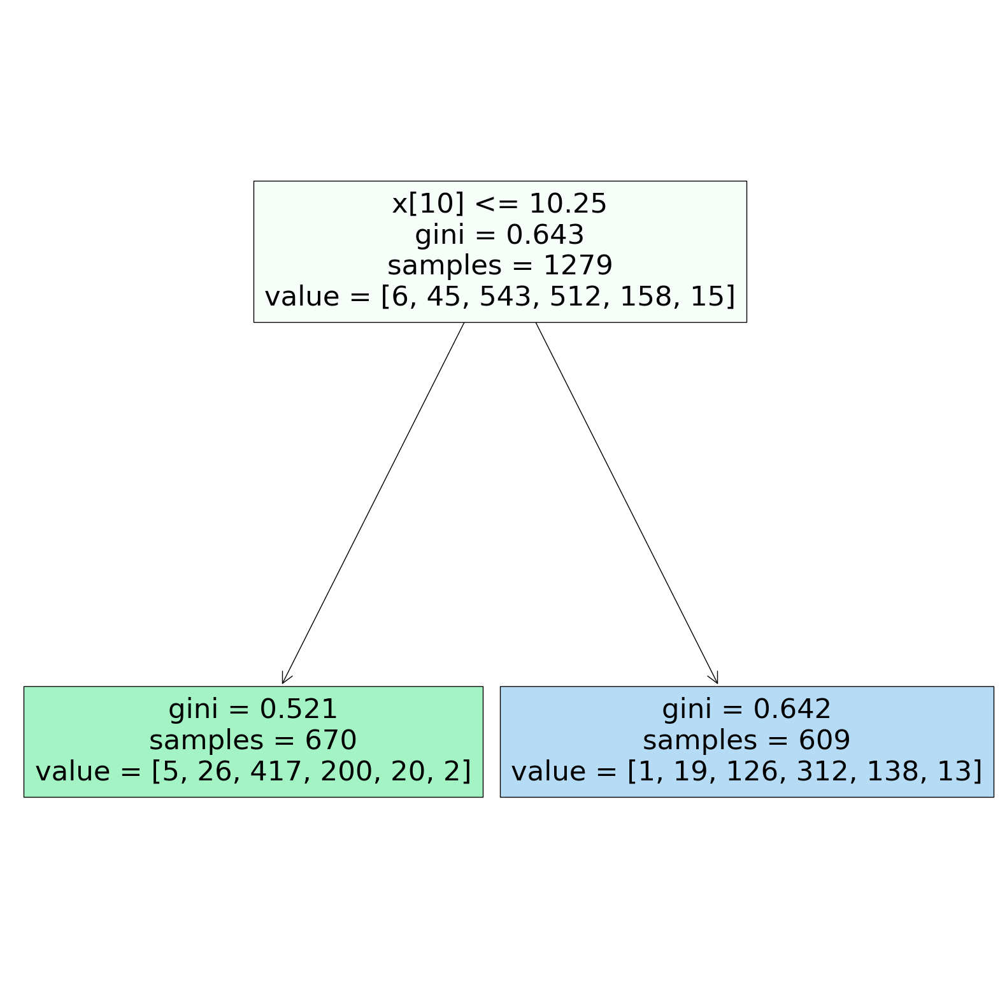

In [78]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_ccp,filled=True);

- This has been done after hyperparameter tuning which we got using pruning

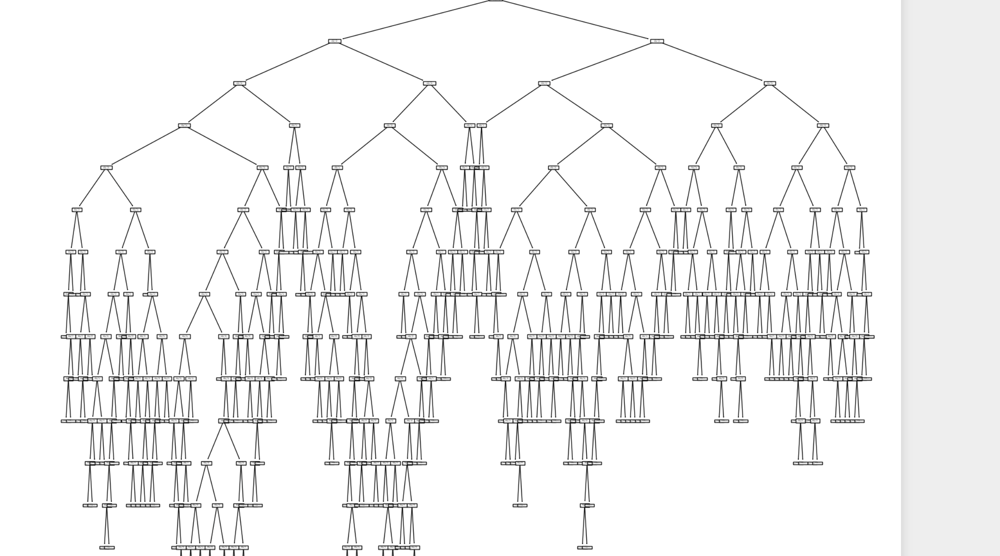

- This was our previous tree

#### New score which we would be getting

In [79]:
dt_ccp.score(xtest,ytest)

0.525

### <font color='green'> Using RandomSearchCV or GridSearchCV</font>

In [90]:
grid_pram={
    'criterion':['gini','entropy'],
    'splitter':['best','random'],
    'max_depth':range(2,40,1),
    'min_samples_leaf':range(2,40,1),
    'min_samples_leaf':range(1,10,1) 
}

In [91]:
# n_jobs=-1 then it will occupy all the processor
# n_jobs=4 then not all as it will work parallel

In [92]:
grid_cpp=GridSearchCV(estimator=dt_ccp,param_grid=grid_pram,cv=5,n_jobs=-1)

In [93]:
grid_cpp.fit(x1,y1)

/Users/eshantdas/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(ccp_alpha=0.022, random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'splitter': ['best', 'random']})

In [94]:
grid_cpp.best_params_

{'criterion': 'entropy',
 'max_depth': 16,
 'min_samples_leaf': 2,
 'splitter': 'random'}

In [95]:
#So we got our answer now

In [96]:
dt_new=DecisionTreeClassifier(criterion='entropy',max_depth=16,min_samples_leaf=2,splitter='random')

In [97]:
dt_new.fit(x1,y1)

DecisionTreeClassifier(criterion='entropy', max_depth=16, min_samples_leaf=2,
                       splitter='random')

In [107]:
dt_new.score(x1,y1)

0.876

In [108]:
dt_new.score(xtest,ytest)

0.59375

####  If we choose cv=10

In [110]:
grid_cpp=GridSearchCV(estimator=dt_ccp,param_grid=grid_pram,cv=10,n_jobs=-1)

In [111]:
grid_cpp.fit(x1,y1)

/Users/eshantdas/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=10.
  warnings.warn(


GridSearchCV(cv=10,
             estimator=DecisionTreeClassifier(ccp_alpha=0.022, random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'splitter': ['best', 'random']})

In [112]:
grid_cpp.best_params_

{'criterion': 'entropy',
 'max_depth': 15,
 'min_samples_leaf': 2,
 'splitter': 'random'}

In [113]:
dt_new=DecisionTreeClassifier(criterion='entropy',max_depth=15,min_samples_leaf=2,splitter='random')

In [114]:
dt_new.fit(x1,y1)

DecisionTreeClassifier(criterion='entropy', max_depth=15, min_samples_leaf=2,
                       splitter='random')

In [115]:
dt_new.score(x1,y1)

0.882

In [117]:
dt_new.score(xtest,ytest)

0.565625

### GridSearch with ccp as well

In [118]:
grid_pram={
    'criterion':['gini','entropy'],
    'splitter':['best','random'],
    'max_depth':range(2,40,1),
    'min_samples_leaf':range(2,40,1),
    'min_samples_leaf':range(1,10,1),
    'ccp_alpha':np.random.random(20)
}

In [119]:
grid_cpp=GridSearchCV(estimator=dt_ccp,param_grid=grid_pram,cv=5,n_jobs=-1)

In [120]:
grid_cpp.fit(x1,y1)

/Users/eshantdas/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(ccp_alpha=0.022, random_state=0),
             n_jobs=-1,
             param_grid={'ccp_alpha': array([0.80201125, 0.34249843, 0.40299095, 0.58695042, 0.66731082,
       0.03494556, 0.19724366, 0.43130395, 0.19245235, 0.69311398,
       0.95623867, 0.91088492, 0.85669163, 0.87927106, 0.66811139,
       0.06126702, 0.93016469, 0.01587224, 0.03128555, 0.95823562]),
                         'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'splitter': ['best', 'random']})

In [121]:
grid_cpp.best_params_

{'ccp_alpha': 0.01587223680421801,
 'criterion': 'entropy',
 'max_depth': 12,
 'min_samples_leaf': 1,
 'splitter': 'random'}

In [122]:
dt_new=DecisionTreeClassifier(criterion='entropy',max_depth=12,min_samples_leaf=1,splitter='random',ccp_alpha=0.01587223680421801)

In [123]:
dt_new.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.01587223680421801, criterion='entropy',
                       max_depth=12, splitter='random')

In [124]:
dt_new.score(x1,y1)

0.624

In [125]:
dt_new.score(xtest,ytest)

0.515625

In [126]:
#The  difference is less but it took us a long time to fit the GridSearchModel

## <font color='clue'>Confusion Matrix</font>

In [127]:
pred=dt_new.predict(xtrain)

In [130]:
confusion_matrix(ytrain,pred)

array([[  0,   0,   2,   3,   1,   0],
       [  0,   0,  19,  21,   5,   0],
       [  0,   0, 318, 222,   3,   0],
       [  0,   0, 116, 389,   7,   0],
       [  0,   0,   3, 148,   7,   0],
       [  0,   0,   0,  15,   0,   0]])

- 0 0 0 0 0 0 in 2nd and Last Row because the class is not available